Solve neuron voltage, calcium, gating kinetics with homeo. regulation using ODE solver.

In [1]:
using OrdinaryDiffEq, ModelingToolkit, MinimallyDisruptiveCurves, Plots, DiffEqParamEstim, DiffEqSensitivity
using NumericalIntegration, LinearAlgebra, ForwardDiff

In [41]:
const D_noise = 0.01
const VNa = 50
const VK = -80
const VCa = 100
const VCl = -20
const Vleak = -5
const taug = 1.0e3
const tauNa = 1.0e3
const Catgt = 50.
const gleak = 0.01

boltz(V,A,B)= 1.0 ./(1.0 + exp((V+A)./B))

tauX(V,A,B,D,E)= A - (B*boltz(V,D,E))

function Neuron_wHomeo_dynamics(input)
    
    @parameters t
    D = Differential(t)
    
    @parameters  gNa_tgt gKd_tgt gA_tgt gCaT_tgt gCaS_tgt gKCa_tgt gH_tgt
    paramvars = [gNa_tgt, gKd_tgt, gA_tgt, gCaT_tgt, gCaS_tgt, gKCa_tgt, gH_tgt]
    
    @variables V(t) Ca(t) mNa(t) hNa(t) mKd(t) mA(t) hA(t) mCaT(t) hCaT(t) mCaS(t) hCaS(t) mKCa(t) mH(t) gNa(t) gKd(t) gA(t) gCaT(t) gCaS(t) gKCa(t) gH(t) RNa(t) RKd(t) RA(t) RCaT(t) RCaS(t) RKCa(t) RH(t) 
    statevars = [V, Ca, mNa, hNa, mKd, mA, hA, mCaT, hCaT, mCaS, hCaS, mKCa, mH,
                gNa, gKd, gA, gCaT, gCaS, gKCa, gH, RNa, RKd, RA, RCaT, RCaS, RKCa, RH]
    
    #gene expression taus
    tauCaT = (gNa_tgt/gCaT_tgt)*tauNa 
    tauCaS = (gNa_tgt/gCaS_tgt)*tauNa 
    tauA = (gNa_tgt/gA_tgt)*tauNa 
    tauKd = (gNa_tgt/gKd_tgt)*tauNa 
    tauKCa = (gNa_tgt/gKCa_tgt)*tauNa 
    tauH = (gNa_tgt/gH_tgt)*tauNa 
    
    #currents
    INa = gNa*mNa^3*hNa*(VNa - V)
    ICaS= gCaS*mCaS^3*hCaS*(VCa - V)
    ICaT= gCaT*mCaT^3*hCaT*(VCa - V)
    Ih= gH*mH*(VCl - V)
    IKa= gA*mA^3*hA*(VK - V)
    IKCa= gKCa*mKCa^4*(VK - V)
    IKd= gKd*mKd^4*(VK - V)
    Ileak= gleak*(Vleak - V)
    
    
    #gating
    mNainf  = boltz(V,25.5,-5.29)
    taumNa  = tauX(V,1.32,1.26,120.,-25.)
    hNainf  = boltz(V,48.9,5.18)
    tauhNa  = (0.67/(1+exp((V+62.9)/-10.0)))*(1.5 + 1/(1+exp((V+34.9)/3.6)))
    
    mCaTinf  = boltz(V,27.1,-7.2)
    taumCaT  = tauX(V,21.7,21.3,68.1,-20.5)
    hCaTinf  = boltz(V,32.1,5.5)
    tauhCaT  = tauX(V,105.,89.8,55.,-16.9)
    
    mCaSinf  = boltz(V,33.,-8.1)
    taumCaS  = (1.4 + (7/((exp((V+27)/10))+(exp((V+70)/-13)))))
    hCaSinf  = boltz(V,60.,6.2)
    tauhCaS  = 60 + (150/((exp((V+55)/9))+(exp((V+65)/-16))))
    
    mAinf  = boltz(V,27.2,-8.7)
    taumA  = tauX(V,11.6,10.4,32.9,-15.2)
    hAinf  = boltz(V,56.9,4.9)
    tauhA  = tauX(V,38.6,29.2,38.9,-26.5)
    
    mKCainf = (Ca/(Ca+3.0))/(1+exp((V+28.3)/-12.6))
    taumKCa  = tauX(V,90.3,75.1,46.,-22.7)
    
    mKdinf  = boltz(V,12.3,-11.8)
    taumKd  = tauX(V,7.2,6.4,28.3,-19.2)
    
    mHinf  = boltz(V,70.,6.)
    taumH  = tauX(V,272.,-1499.,42.2,-8.73)
    
    Ca_inf = 0.05 + 0.94*(ICaS + ICaT)
    
    eqs = [
        D(V) ~          INa+ICaT+ICaS+IKa+IKCa+IKd+Ih+Ileak,
        D(Ca) ~                  (Ca_inf - Ca),
        D(mNa) ~                 (1/taumNa)*(mNainf - mNa), 
        D(hNa) ~                 (1/tauhNa)*(hNainf - hNa), 
        D(mCaS) ~                (1/taumCaS)*(mCaSinf - mCaS), 
        D(hCaS) ~                (1/tauhCaS)*(hCaSinf - hCaS), 
        D(mCaT) ~                (1/taumCaT)*(mCaTinf - mCaT), 
        D(hCaT) ~                (1/tauhCaT)*(hCaTinf - hCaT), 
        D(mH) ~                  (1/taumH)*(mHinf - mH), 
        D(mA) ~                  (1/taumA)*(mAinf - mA), 
        D(hA) ~                  (1/tauhA)*(hAinf - hA), 
        D(mKCa) ~                (1/taumKCa)*(mKCainf - mKCa), 
        D(mKd) ~                 (1/taumKd)*(mKdinf - mKd),
        
        D(gNa) ~                 (1/taug)*(RNa-gNa),
        D(gCaS) ~                (1/taug)*(RCaS-gCaS),
        D(gCaT) ~                (1/taug)*(RCaT-gCaT),
        D(gA) ~                  (1/taug)*(RA-gA),
        D(gKd) ~                 (1/taug)*(RKd-gKd),
        D(gKCa) ~                (1/taug)*(RKCa-gKCa),
        D(gH) ~                  (1/taug)*(RH-gH),
        D(RNa) ~                 (1/tauNa)*(Catgt-Ca),
        D(RCaS) ~                (1/tauCaS)*(Catgt-Ca),
        D(RCaT) ~                (1/tauCaT)*(Catgt-Ca),
        D(RA) ~                  (1/tauA)*(Catgt-Ca),
        D(RKd) ~                 (1/tauKd)*(Catgt-Ca),
        D(RKCa) ~                (1/tauKCa)*(Catgt-Ca),
        D(RH) ~                  (1/tauH)*(Catgt-Ca)
        
    ]
    
    ps = paramvars .=> [700.,90.,85.,6.25,2.25,50.,0.3]
    ics = statevars .=> [-60,0.05,0,0,0,0,0,0,0,0,0,0,0,780.,100.,94.,7.,2.5,55.,0.03,
                        780.,100.,94.,7.,2.5,55.,0.03]
    
    od = ODESystem(eqs, t, statevars, paramvars)
    tspan = (0.,800.)
    return od, ics, tspan, ps
end


Neuron_wHomeo_dynamics (generic function with 1 method)

In [3]:
alg = Rosenbrock23
solve = OrdinaryDiffEq.solve 

solve (generic function with 18 methods)

In [42]:
od,ic,_ , ps = Neuron_wHomeo_dynamics(t->0.);
tspan = (0,800.);
tsteps = 0.:10.:800; 

In [43]:
nom_prob = ODEProblem(od,ic,tspan,ps)
p0 = last.(ps)

7-element Vector{Float64}:
 700.0
  90.0
  85.0
   6.25
   2.25
  50.0
   0.3

In [44]:
sol = solve(nom_prob, alg())
plot()
plot(sol,legend=:false)
ylims!((-80,400))

In [7]:
nom_ca = sol[2,400:800];

### Cost function
$$ C(p^*) = \int^{t_f}_{t_0} | Ca_{tgt} - Ca (p^*, t)| \ dt $$

where $p^*$ are varying parameters.

In [45]:
function redo(p)
    prob = remake(nom_prob; p=p)
    sol = solve(prob, alg())
    return prob,sol
end

function loss(p)
  prob,sol = redo(p)
  p_feature = sol[2,400:800]
  x = sol.t[400:800]
  y = abs.(50.0 .- p_feature)
  loss = integrate(x,y)
  return loss
end

loss (generic function with 1 method)

In [46]:
function lossgrad(p,g)
  g[:] = ForwardDiff.gradient(p) do p
    loss(p)
  end
  return loss(p)
end

lossgrad (generic function with 1 method)

In [47]:
cost = DiffCost(loss, lossgrad)

(::DiffCost{typeof(loss), typeof(lossgrad)}) (generic function with 2 methods)

In [ ]:
# never ending...
@time hess = ForwardDiff.hessian(loss, p0);

In [15]:

prob,sol_p = redo(p0)
loss_for_H(sol) = integrate(sol.t[400:800],abs.(50.0 .- sol[2,400:800]))
    
#never ends...
@time H  = second_order_sensitivities(loss_for_H,prob,Rosenbrock23(),saveat=0.1,abstol=1e-12,reltol=1e-12)

LoadError: InterruptException:

Try initial direction along A=0.5, CaT=1.0

In [75]:
init_dir = [0., 0., 0.0, 1.0, 0., 0., 0.];
momentum = 9000.; span = (-15.,15.)

(-15.0, 15.0)

In [76]:
curve_prob = curveProblem(cost, p0, init_dir, momentum, span)
@time mdc = evolve(curve_prob, Tsit5)

 11.504111 seconds (719.04 k allocations: 266.121 MiB, 7.39% gc time)


┌ Info: applying readjustment at t=7.698048853473431e-5, |res| = 0.001080582026174891
└ @ MinimallyDisruptiveCurves /Users/andrearamirez/.julia/packages/MinimallyDisruptiveCurves/2vxNS/src/evolve_options.jl:40


MinimallyDisruptiveCurve{ODESolution{Float64, 2, Vector{Vector{Float64}}, Nothing, Nothing, Vector{Float64}, Nothing, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, SciMLBase.NullParameters, ODEFunction{true, MinimallyDisruptiveCurves.var"#2#3"{curveProblem{DiffCost{typeof(loss), typeof(lossgrad)}, Vector{Float64}, Vector{Float64}, Float64, Tuple{Float64, Float64}}, Vector{Float64}, Int64}, UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing}, Base.Iterators.Pairs{Union{}, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}, SciMLBase.StandardODEProblem}, DataType, SciMLBase.LinearInterpolation{Vector{Float64}, Vector{Vector{Float64}}}, Nothing}, DiffCost{typeof(loss), typeof(lossgrad)}}(ODESolution{Float64, 2, Vector{Vector{Float64}}, Nothing, Nothing, Vector{Float64}, Nothing, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, SciMLBase.NullParameters, 

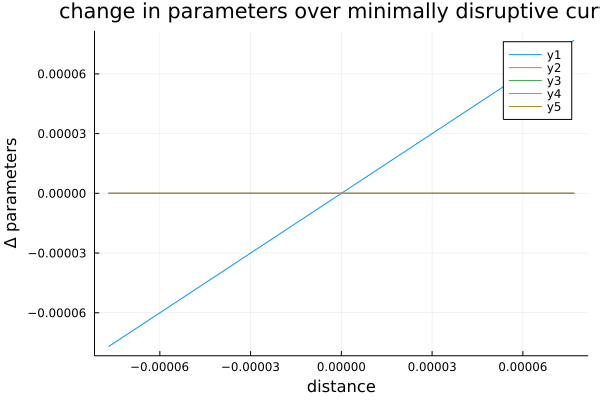

In [77]:
plot()
p1 = plot(mdc)

In [36]:
s = 10
function check_sol_at_dist(s, prob, mdc)
    prob = remake(prob;p = mdc(s)[:states])
    return solve(prob, Rosenbrock23())   
end
ss = check_sol_at_dist(s,nom_prob,mdc)
p1 = plot(ss)